### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import plotly.express as px


sns.set()
from sklearn.preprocessing import MinMaxScaler

### Reading the data

In [2]:
df = pd.read_csv("../data/data.csv")

### Overall descriptive statistics of your dataset

In [3]:
df.head()

,Id,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,CITY,STATE,CURRENT_JOB_YRS,CURRENT_HOUSE_YRS,Risk_Flag
0,1,1303834,23,3,single,rented,no,Mechanical_engineer,Rewa,Madhya_Pradesh,3,13,0
1,2,7574516,40,10,single,rented,no,Software_Developer,Parbhani,Maharashtra,9,13,0
2,3,3991815,66,4,married,rented,no,Technical_writer,Alappuzha,Kerala,4,10,0
3,4,6256451,41,2,single,rented,yes,Software_Developer,Bhubaneswar,Odisha,2,12,1
4,5,5768871,47,11,single,rented,no,Civil_servant,Tiruchirappalli[10],Tamil_Nadu,3,14,1


Number of records present currently in the dataframe. Here 252000 indicates the number of rows and 13 indicates the number of columns present.

In [4]:
df.shape

(252001, 13)

Display all the columns in the dataframe along with respective data type.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 252001 entries, 0 to 252000
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Id                 252001 non-null  int64 
 1   Income             252001 non-null  int64 
 2   Age                252001 non-null  int64 
 3   Experience         252001 non-null  int64 
 4   Married/Single     252001 non-null  object
 5   House_Ownership    252001 non-null  object
 6   Car_Ownership      252001 non-null  object
 7   Profession         252001 non-null  object
 8   CITY               252001 non-null  object
 9   STATE              252001 non-null  object
 10  CURRENT_JOB_YRS    252001 non-null  int64 
 11  CURRENT_HOUSE_YRS  252001 non-null  int64 
 12  Risk_Flag          252001 non-null  int64 
dtypes: int64(7), object(6)
memory usage: 25.0+ MB


Cleaning all columm names

In [6]:
# Standardising the Feature names in the dataframe.
df.rename(
    columns={
        "CITY": "City",
        "STATE": "State",
        "CURRENT_JOB_YRS": "Current_Job_Years",
        "CURRENT_HOUSE_YRS": "Current_House_Years",
    },
    inplace=True,
)
(df.columns).tolist()

['Id',
 'Income',
 'Age',
 'Experience',
 'Married/Single',
 'House_Ownership',
 'Car_Ownership',
 'Profession',
 'City',
 'State',
 'Current_Job_Years',
 'Current_House_Years',
 'Risk_Flag']

Data description of all features present in the file

In [7]:
data_info = pd.read_csv("../data/Data_Dictionary.csv")
data_info

,Column_Name,Data_Description,Data_Class,Data_Type,Domain
0,Id,Customer Identification Number,Categorical,int,Positive integers
1,Income,Income of the Customer,Continuous,int,Positive integers
2,Age,Age of the Customer,Continuous,int,Positive integers
3,Experience,Total Professional Experience in Years,Continuous,int,Positive integers
4,Married/Single,Marital Status of the Customer,Categorical,string,"[single,married]"
5,House_Ownership,Home Ownership Status of the Customer,Categorical,string,"3 String values [rented,owned,norent_noown]"
6,Car_Ownership,Car Ownership Status of the Customer,Categorical,string,"[yes,no]"
7,Profession,Occupation of the Customer,Categorical,string,51 String values
8,City,City of Residence,Categorical,string,317 String values
9,State,State of Residence,Categorical,string,29 String values


Exclude target label from given features in analysis

In [8]:
df_features = df.iloc[:, :-1]
df_features.head()

,Id,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,City,State,Current_Job_Years,Current_House_Years
0,1,1303834,23,3,single,rented,no,Mechanical_engineer,Rewa,Madhya_Pradesh,3,13
1,2,7574516,40,10,single,rented,no,Software_Developer,Parbhani,Maharashtra,9,13
2,3,3991815,66,4,married,rented,no,Technical_writer,Alappuzha,Kerala,4,10
3,4,6256451,41,2,single,rented,yes,Software_Developer,Bhubaneswar,Odisha,2,12
4,5,5768871,47,11,single,rented,no,Civil_servant,Tiruchirappalli[10],Tamil_Nadu,3,14


Segragating numerical features

In [9]:
numerical_vars = data_info[
    (data_info["Data_Type"] == "int") & (data_info["Column_Name"] != "Risk_Flag")
]["Column_Name"]
numerical_vars.reset_index(drop=True, inplace=True)
numerical_vars

0                     Id
1                 Income
2                    Age
3             Experience
4      Current_Job_Years
5    Current_House_Years
Name: Column_Name, dtype: object

Segragating string variables, all of which are categorical

In [10]:
string_vars = data_info[data_info["Data_Type"] == "string"]["Column_Name"]
string_vars.reset_index(drop=True, inplace=True)
string_vars

0     Married/Single
1    House_Ownership
2      Car_Ownership
3         Profession
4               City
5              State
Name: Column_Name, dtype: object

The statistical information of the numerical features in our dataset is as follows:-

In [11]:
desc_numeric = pd.DataFrame()

for var in numerical_vars:
    temp_df = pd.DataFrame()
    temp_df["Feature"] = [var]
    temp_df["Total Count"] = len(df[var])
    temp_df["Null Value Count"] = [df[var].isnull().sum()]
    temp_df["Cardinality"] = [df[var].nunique()]
    temp_df["Maximum Value"] = [df[var].max()]
    temp_df["Mininum Value"] = [df[var].min()]
    temp_df["Q1"] = [df[var].quantile(0.25)]
    temp_df["Mean Value"] = [df[var].mean()]
    temp_df["Q3"] = [df[var].quantile(0.75)]
    temp_df["Std. Dev"] = [df[var].std()]
    desc_numeric = pd.concat([desc_numeric, temp_df])

desc_numeric

,Feature,Total Count,Null Value Count,Cardinality,Maximum Value,Mininum Value,Q1,Mean Value,Q3,Std. Dev
0,Id,252001,0,252001,252001,1,63001.0,1.260010e+05,189001.0,7.274657e+04
0,Income,252001,0,41921,9999938,10300,2503015.0,4.997097e+06,7477502.0,2.878322e+06
0,Age,252001,0,59,79,21,35.0,4.995398e+01,65.0,1.706389e+01
0,Experience,252001,0,21,20,0,5.0,1.008442e+01,15.0,6.002586e+00
0,Current_Job_Years,252001,0,15,14,0,3.0,6.333880e+00,9.0,3.647046e+00
0,Current_House_Years,252001,0,6,14,7,11.0,1.199777e+01,13.0,1.399070e+00


The statistical information for all the features which are categorical and of string type

In [12]:
desc_string = pd.DataFrame()

for var in string_vars:
    temp_df = pd.DataFrame()
    temp_df["Feature"] = [var]
    temp_df["Total Count"] = len(df[var])
    temp_df["Null Value Count"] = [df[var].isnull().sum()]
    temp_df["Cardinality"] = [df[var].nunique()]
    temp_df["Mode Value"] = [df[var].mode()[0]]
    temp_df["Mode Frequency"] = [(df[var] == temp_df["Mode Value"][0]).sum()]
    temp_df["Mode Ratio"] = [(df[var] == temp_df["Mode Value"][0]).sum()] / temp_df[
        "Total Count"
    ]
    desc_string = pd.concat([desc_string, temp_df])

desc_string

,Feature,Total Count,Null Value Count,Cardinality,Mode Value,Mode Frequency,Mode Ratio
0,Married/Single,252001,0,2,single,226273,0.897905
0,House_Ownership,252001,0,3,rented,231899,0.920230
0,Car_Ownership,252001,0,2,no,176001,0.698414
0,Profession,252001,0,51,Physician,5957,0.023639
0,City,252001,0,318,Vijayanagaram,1259,0.004996
0,State,252001,0,30,Uttar_Pradesh,28400,0.112698


#### Plotting Histograms of all Numeric features along with their probability density

In [13]:
df_features.corr()

,Id,Income,Age,Experience,Current_Job_Years,Current_House_Years
Id,1.000000,-0.001335,-0.001825,-0.005815,-0.003249,0.001947
Income,-0.001335,1.000000,-0.000642,0.006427,0.007043,-0.002373
Age,-0.001825,-0.000642,1.000000,-0.001113,0.002153,-0.020114
Experience,-0.005815,0.006427,-0.001113,1.000000,0.646096,0.019320
Current_Job_Years,-0.003249,0.007043,0.002153,0.646096,1.000000,0.005369
Current_House_Years,0.001947,-0.002373,-0.020114,0.019320,0.005369,1.000000


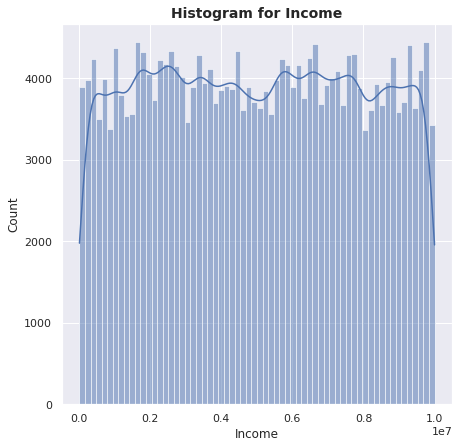

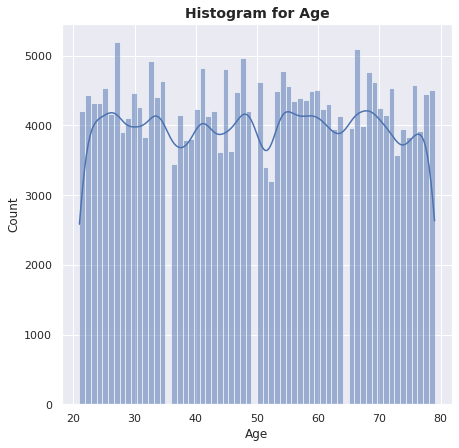

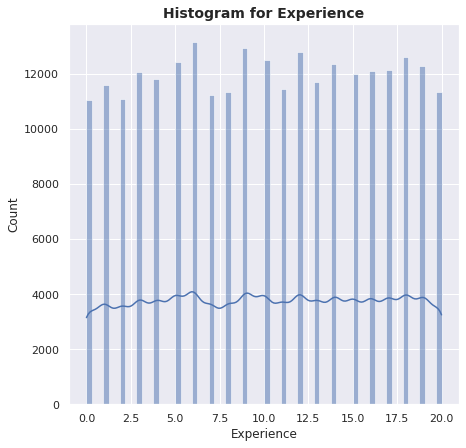

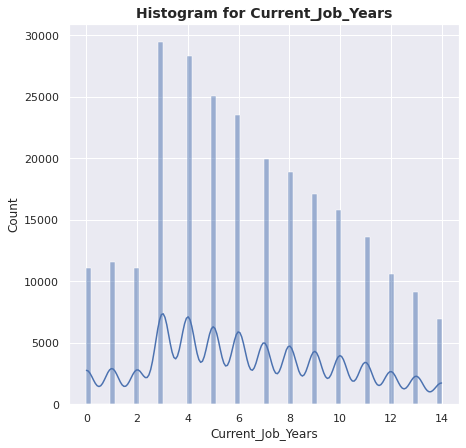

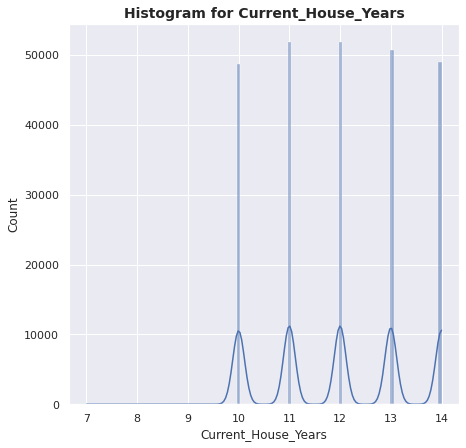

In [14]:
numerical_vars = numerical_vars[1:]
for num in numerical_vars:
    sns.set(style="darkgrid")
    fig, axs = plt.subplots(1, 1, figsize=(7, 7))
    sns.histplot(data=df[numerical_vars], x=num, kde=True).set_title(
        "Histogram for {}".format(num), fontsize=14, fontweight="bold"
    )

Plotting Bar Graphs for portraying the distribution of some of the Categorical Variables

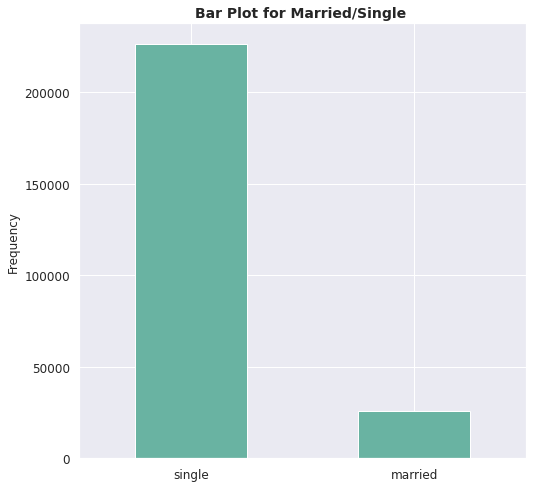

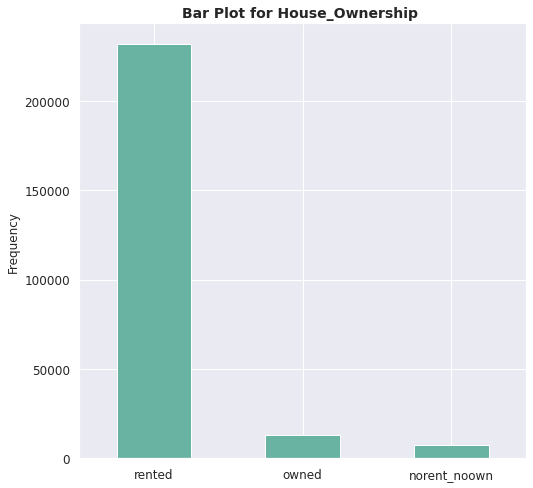

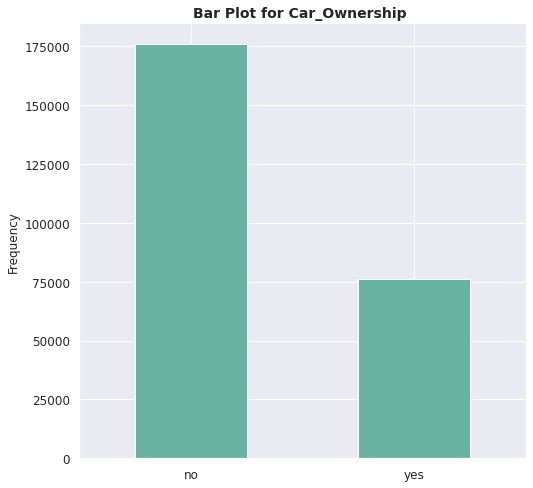

In [15]:
string_vars = string_vars[0:3]

for val in string_vars:
    sns.set(style="darkgrid")
    fig, axs = plt.subplots(1, 1, figsize=(8, 8))
    df[val].value_counts().plot(
        kind="bar", ylabel="Frequency", color="#69b3a2", rot=0, fontsize=12
    ).set_title("Bar Plot for {} ".format(val), fontsize=14, fontweight="bold")

conmputed the boxplots for all the numeric features which are present in our dataset. As evident from the below Boxplots there aren't any outliers present in our dataset. None of the input datapoints which will be passed on the our model eventually are more than 1.5(IQR) above the upper quartile or more than 1.5(IQR) below the lower quartile. We do not possessany data point which is conspicuously diverse from the rest of the dataset

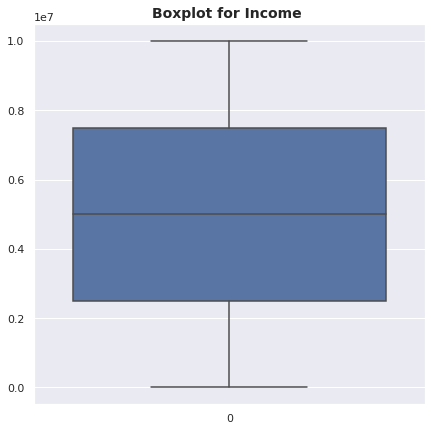

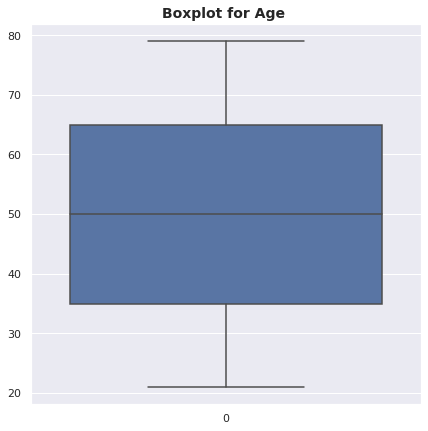

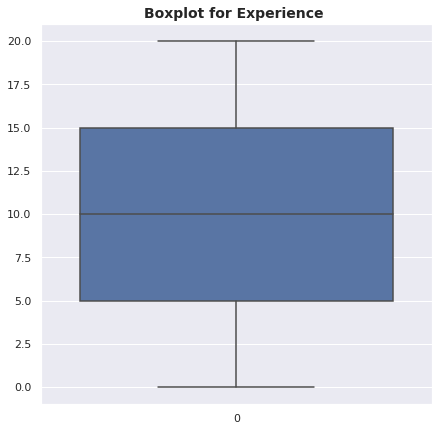

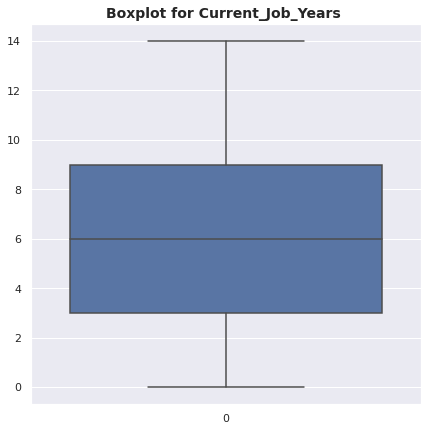

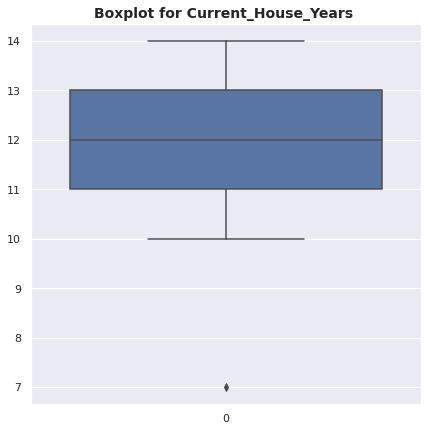

In [16]:
for num in numerical_vars:
    sns.set(style="darkgrid")
    fig, axs = plt.subplots(1, 1, figsize=(7, 7))
    sns.boxplot(data=df[num], palette="deep").set_title(
        "Boxplot for {} ".format(num), fontsize=14, fontweight="bold"
    )

<AxesSubplot:>

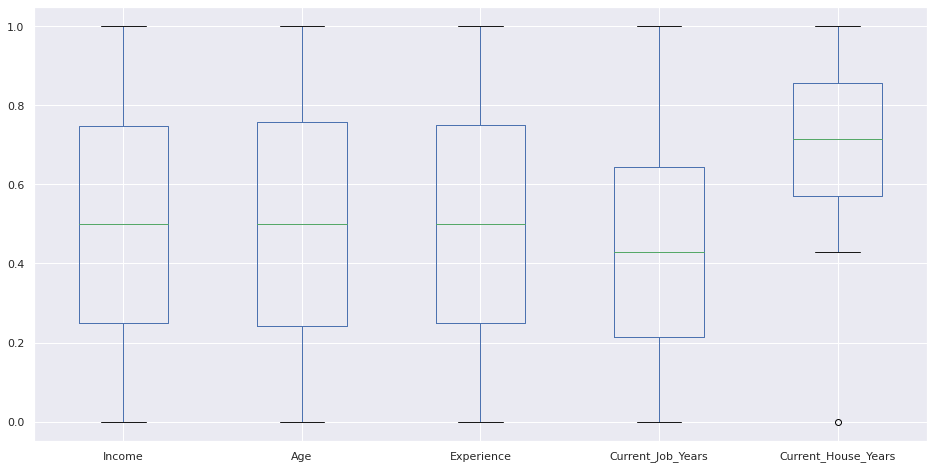

In [17]:
sc_x = MinMaxScaler()
pd.DataFrame(
    sc_x.fit_transform(df[numerical_vars]), columns=df[numerical_vars].columns
).plot(kind="box", figsize=(16, 8))

### Data Preprocessing:

In order to remove inconsistencies in the categorical(texual) features, we have created a function which will eliminate numbers if not deemed necessary for that particular feature. It will also clean the additional parentheses, punctuation and any special characters. We have then added the refined data back to our dataframe

In [18]:
temp_str_df = pd.DataFrame()
temp_unclean_cols = data_info[data_info["Data_Type"] == "string"]["Column_Name"]
temp_str_df = df[temp_unclean_cols[3:]]
temp_str_df.head()

,Profession,City,State
0,Mechanical_engineer,Rewa,Madhya_Pradesh
1,Software_Developer,Parbhani,Maharashtra
2,Technical_writer,Alappuzha,Kerala
3,Software_Developer,Bhubaneswar,Odisha
4,Civil_servant,Tiruchirappalli[10],Tamil_Nadu


In [19]:
def clean_text(text):
    text = text.encode("ascii", errors="ignore").decode("utf8")
    text = re.sub(r"[()\[\]]", "", text)
    text = re.sub(r"[0-9]", "", text)
    text = re.sub(r"[_]", " ", text)
    return text

In [20]:
temp_cols = temp_unclean_cols[3:]
for i in temp_cols:
    temp_str_df[i] = temp_str_df[i].apply(clean_text)

temp_str_df["Id"] = df["Id"]
temp_str_df.head()

<ipython-input-20-3e6f3c607a2b>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_str_df[i] = temp_str_df[i].apply(clean_text)
<ipython-input-20-3e6f3c607a2b>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_str_df["Id"] = df["Id"]


,Profession,City,State,Id
0,Mechanical engineer,Rewa,Madhya Pradesh,1
1,Software Developer,Parbhani,Maharashtra,2
2,Technical writer,Alappuzha,Kerala,3
3,Software Developer,Bhubaneswar,Odisha,4
4,Civil servant,Tiruchirappalli,Tamil Nadu,5


In [21]:
df_begin = df_features.iloc[:, 0:7]
df_end = df_features.iloc[:, [0, -2, -1]]

df_refined = df_begin.merge(temp_str_df, on="Id", how="inner")
df_refined = df_refined.merge(df_end, on="Id", how="inner")
df_refined.head()

,Id,Income,Age,Experience,Married/Single,House_Ownership,Car_Ownership,Profession,City,State,Current_Job_Years,Current_House_Years
0,1,1303834,23,3,single,rented,no,Mechanical engineer,Rewa,Madhya Pradesh,3,13
1,2,7574516,40,10,single,rented,no,Software Developer,Parbhani,Maharashtra,9,13
2,3,3991815,66,4,married,rented,no,Technical writer,Alappuzha,Kerala,4,10
3,4,6256451,41,2,single,rented,yes,Software Developer,Bhubaneswar,Odisha,2,12
4,5,5768871,47,11,single,rented,no,Civil servant,Tiruchirappalli,Tamil Nadu,3,14


In [22]:
px.treemap(
    df_refined,
    values="Income",
    path=["Current_Job_Years", "Profession"],
    hover_name="Profession",
    color="Experience",
)

In [23]:
px.sunburst(
    df_refined,
    values="Current_House_Years",
    color="Age",
    path=["House_Ownership", "Current_House_Years", "Age"],
    color_continuous_scale="tealgrn",
)

In [24]:
px.histogram(
    df_refined, x="Married/Single", hover_name="Age", color="Car_Ownership", nbins=20
)

In [25]:
india_json = r"../data/India_Geodata.json"

fig = px.choropleth(
    df_refined,
    geojson=india_json,
    featureidkey="properties.ST_NM",
    locations="State",
    color="Income",
    color_continuous_scale="Reds",
)

fig.update_geos(fitbounds="locations", visible=False)

fig.show()

Analyze the balance or distribution of your target variable

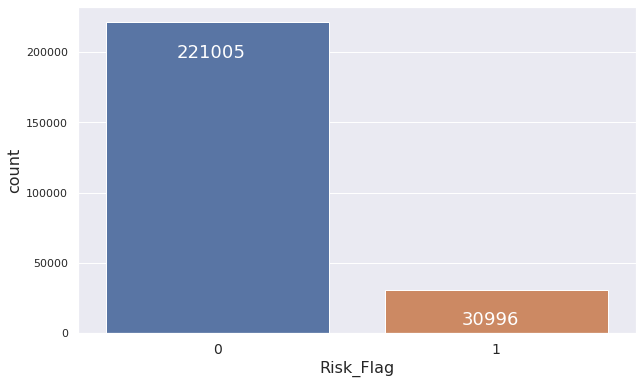

In [26]:
plt.figure(figsize=(10,6))
plt.xticks(fontsize=14)
plt.xticks(fontsize=14)
plt.xlabel('Risk_Flag',fontsize=16)
plt.ylabel('Count',fontsize=16)
ax=sns.countplot(x=df['Risk_Flag'], data=df)
for p in ax.patches:
    ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.38, p.get_height()), ha='center', va='top', color='white', size=18)

The above countplot exhibits the distribution of our target variable 'Risk_Flag'. Unfortunately we are posed with imbalanced data for the target variable. This may influence the learning of our model/s and may provide us with biased results. We will explore that 